# Homework 11: Predictive Modelling and Model Comparision

Name: Mandar Brahmbhnatt

Student ID: 511338

Collaborators:


## Instructions

This is the final homework/Project, which is about Understanding Data Profiling, Feature Engineering, Feature Selection, Model Comparision & Selection as a _final project_ for our 217a class.

We will be using the techniques and approaches introduced throughout the course focusing mainly towards the second half of the semester:

* [M0] Python for DS
* [M1] The DS and ML Workflows
* [M2] Exploratory Data Analsyis
* **[M3] Linear Regression (if applicable - depends on problem/dataset)**
* **[M4] Linear Classification (if applicable - depends on problem/dataset)**
* [M5] Sentiment Analysis (if applicable - depends on problem/dataset)
* [M6] Ethical Thinking for Data Science (if applicable - depends on problem/dataset)
* **[M7] Performance Evaluation: Overfitting & Cross-Validation**
* **[M8] Clustering K-Means (if applicable - depends on problem/dataset)** 
* **[M9] Similarity-based Learning K-NN (if applicable - depends on problem/dataset)**
* **[M10] More Models (Decision Tree, Random Forest, Neural Network) for Feature Engineering & Model Comparision & Selection**
* **[M11] DS Workflow in Python: Data Profiling and ML Pipelines**

The main focus of this project is majorly on the last modules [M7]-[M11]. In particular, it will be helpful to review **Lab 3 & hw 3 onwards for more clarification**.
Most of the things you will do in this final project are explained in `Lab10` and `Lab11`. Then, review the other labs and hws to recap the general workflow of our DS approaches to the various problems we have worked on so far. This will help you to be prepared for all the steps in this project, so that you do not miss anything. 

In gernal, you should feel free to import any package that we have previously used in class. Ensure that all plots have the necessary components that a plot should have (e.g. axes labels, a title, a legend).

Additionally, note that this assignment is more like a project than a typical homework and it will have a slightly different structure than the hws in the past. One of the reasons why Jupyter Notebooks are so popular in the field is because you can really treat them like notebooks to explain your findings as you discover them. In this assignment, we provide some **Problem** stubs following the DS workflow and you will need to fill in the analysis and structure as you go.

Furthermore, in addition to recording your collaborators on this homework, please also remember to cite/indicate all external sources used when finishing this assignment. This includes peers, TAs, and links to online sources. 

Frequently **save** your notebook!

### Collaborators and Sources
Furthermore, in addition to recording your **collaborators** on this homework, please also remember to **cite/indicate all external sources** used when finishing this assignment. 
> This includes peers, TAs, and links to online sources. 

Note that these citations will not free you from your obligation to submit your _own_ code and write-ups, however, they will be taken into account during the grading and regrading process.

In [91]:
# collaborators and sources:
# Albert Einstein and Marie Curie
# https://developers.google.com/edu/python/strings

# your code here
answer = 'my answer'

### Submission instructions
* Submit this Python notebook, including your answers in the code cells as homework submission.
* **Feel free to add as many cells as you need to** — just make sure you don't change what we gave you. 
* **Does it spark joy?** Note that you will be partially graded on the presentation (_cleanliness, clarity, comments_) of your notebook so make sure you [Marie Kondo](https://lifehacker.com/marie-kondo-is-not-a-verb-1833373654) your notebook before submitting it.

## 1. Introduction

For our final project this semester, we'll take a look at data for Melbourne Housing Price Prediction
https://www.kaggle.com/datasets/dansbecker/melbourne-housing-snapshot.


As you have seen throughout the semseter we have learned various techniques to solve a problem task (Classification, Regression, Clustering etc.) starting from problem formulation to EDA to model building to model evaluation and performing feaure engineering and selection in order to improve the model's performance.
You will be combining all the knowledge learned so far in this final project. You will be making assuptions and decisions on your own with appropriate justifications in writeups about how to improve the prediction model using all the tools and techniques learned so far and provide the best model at the end.


The project aims at building a model of housing prices to predict median house values in Melbourne using the provided dataset. This model should learn from the data and be able to predict the median housing price in any district, given all the other metrics.

Our goal will be to use this dataset to gain some insight about characteristics of different features.
We will be using data profiling from pandas and create models (hopefully more than 3) and compare them to find out which model performed the best and probably explain why it is the best model among all in this data.


### Problem 1.1

Download the data and load it in this notebook for further processing and analysis.

Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')
(13580, 21)


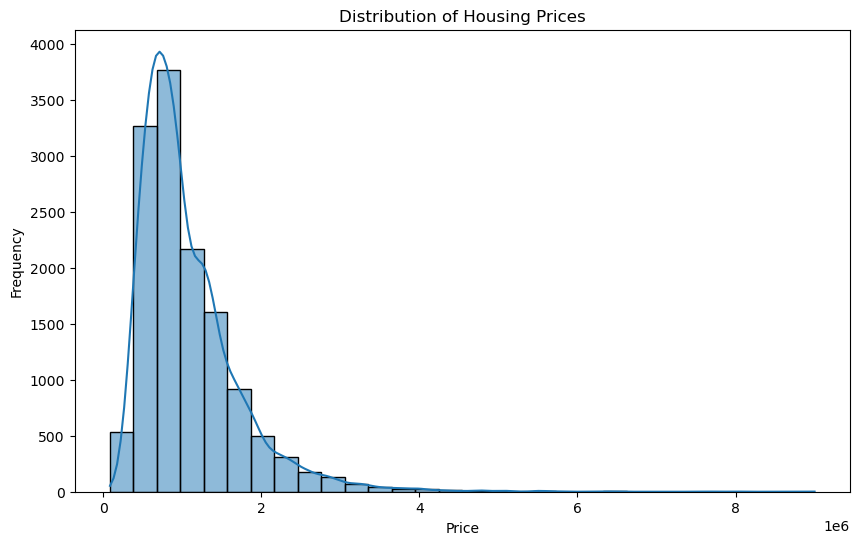

In [92]:
# BEGIN SOLUTION
%matplotlib inline

# Your code for loading data and creating the histogram
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

data = pd.read_csv('data/melb_data.csv')
print(data.columns)
print(data.shape)

plt.figure(figsize=(10, 6))
sns.histplot(data['Price'], bins=30, kde=True)
plt.title('Distribution of Housing Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

# END SOLUTION

**Write-up!** Describe the data, answering questions including, but not limited to, these: Where does the data come from? How was it obtained? How many examples and features does the dataset have? What kinds of features are in the dataset? What values can these features take? What kind of data science problem is this? What application area does the dataset fall into? What kind of prediction (regression, classification or clustering) we are doing with this dataset and why?
> **Hint**: Recall, our goal is to build a model of housing prices to predict median house values.

The dataset consists of a total of 21 features or columns. Each row represents a specific housing example or observation in Melbourne. The goal of this project is to build a predictive model for housing prices in Melbourne. This is a regression problem because the target variable ('Price') is a continuous variable representing the median house value. The features include housing characteristics like location, amount of rooms, year built, etc. It also contains listing details like the seller. The application area is real estate, making this a business problem.

### Problem 1.2: Getting Familiar with the Data

Generate the data report using __ProfileReport__ as we did in lab 11.

In [93]:
# BEGIN SOLUTION
from pandas_profiling import ProfileReport

#calling the function to gerenrate the data profile report
ProfileReport(data)

# END SOLUTION

/Users/Mandar/anaconda3/envs/cse217a/lib/python3.10/site-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/Users/Mandar/anaconda3/envs/cse217a/lib/python3.10/site-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:
/var/folders/hw/qlfdc73939ng3z_mlf4m3swm0000gn/T/ipykernel_34226/3188652197.py:2: DeprecationWarning: `

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Problem 1.3: Data Description

**Write-up!** What are the major highlights and interesting aspects in the report generated in the previous cell (or in your own EDA process). 
Describe your insights using the data/features/visualizations/statistics. Be sure to consider the relationship among features such as correlation and interaction, as well as distributions, missing data, outliers. Include additional visualizations as necessary.

The data has a large variation in correlation. It has both numerical and categorical data. This means we have to encode the categorical data to use it. Additionally, there are missing values that must be imputed. There are varying levels of correlation. The highest correlated feautes include bedrooms and bathrooms and year built. 

/var/folders/hw/qlfdc73939ng3z_mlf4m3swm0000gn/T/ipykernel_34226/1247138982.py:10: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


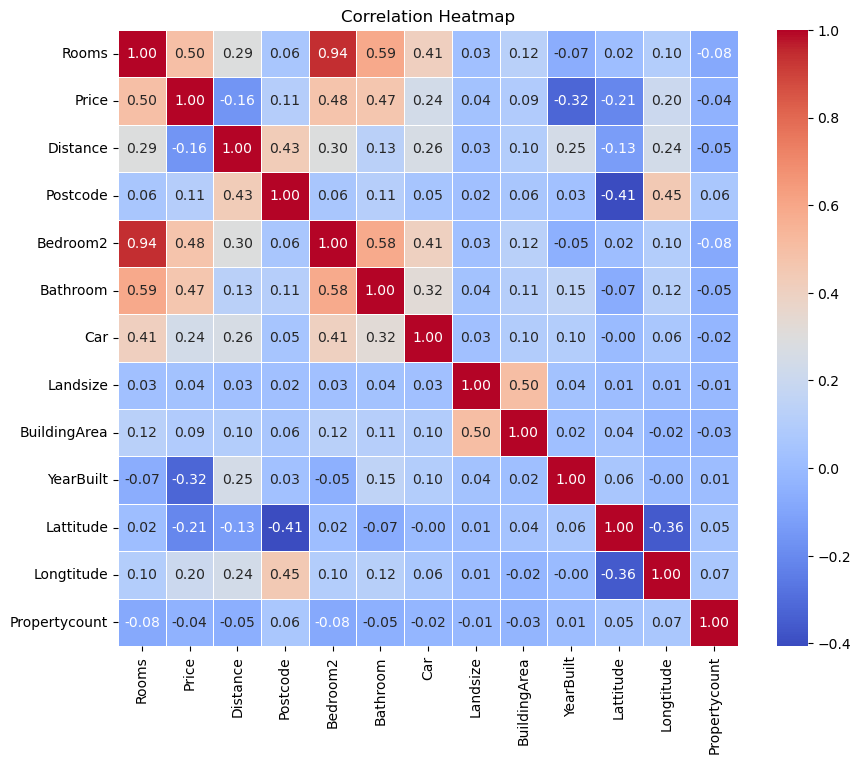

In [103]:
# BEGIN SOLUTION

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt




correlation_matrix = data.corr()


plt.figure(figsize=(10, 8))


sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)


plt.title('Correlation Heatmap')


plt.show()



# END SOLUTION

### Problem 1.4: Split the Data

Extract input (X) and output (y) data from the dataset. 

Use the train and test split from the scikit learn library to split the data into 80% training and 20% testing.

Then, initalize the Kfolds. Be sure to use these folds when executing cross validation below so that the results are comparable.

In [95]:
# BEGIN SOLUTION


from sklearn.model_selection import train_test_split, KFold
y = data['Price']
X = data.drop('Price', axis=1)  
  # Target variable


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)




# END SOLUTION

**Write-up!** Why 80% train and 20% test split is considered a good practice? How would you pick the train-test split size if the dataset is relatively small or large? What is the purpose of using cross validation technique and how does it ensure model robustness? What is Data snooping and how do you avaoid it?

Allocating 80% of the data for training provides a substantial amount of data for the model to learn patterns and relationships within the dataset. Reserving 20% for testing allows for a reasonable amount of data to evaluate the model's performance on unseen data. This ration also tends to prevent overfitting.

## Problem 2: Preprocessing and Baseline Models

### Problem 2.1: Preprocessing for the Baseline Models

Let's start by preprocessing the data so that we can train some baseline models. Note that categorical variables will need to be encoded and missing values should be appropriately delt with using imputation. Also, some models may require scaling. Imputation and scaling should be done in a manner that aovids data snooping.
> Hint: The use of Scikit-Learn's Pipelines are highly encouraged!

In [96]:
# BEGIN SOLUTION

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split


numerical_features = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X_train.select_dtypes(include=['object']).columns

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)

# END SOLUTION


In [98]:
print(X_train.shape)



(10864, 20)


### Problem 2.2: Perform Linear Regression

Perform Linear Regression on training data. Predict the output for the test dataset using the fitted model. Print the root mean squared error (RMSE) and R^2 value from Linear Regression for test data set.


In [99]:
# BEGIN SOLUTION

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np


linear_reg_model = LinearRegression()


linear_reg_model.fit(X_train_preprocessed, y_train)


y_pred = linear_reg_model.predict(X_test_preprocessed)


rmse = np.sqrt(mean_squared_error(y_test, y_pred))


r2_value = r2_score(y_test, y_pred)


print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R^2 Value: {r2_value}')



Root Mean Squared Error (RMSE): 505489.70815143734
R^2 Value: 0.3567197054137822


**Write-up!** What does R^2 tell us about the model's performance? What does RMSE tell us about the model's performance?

The R^2 is quite low and the RSME is quite high. This suggests that a linear model is not the best type of model to best predict the type of data that we have. An r^2 of one is ideal.

### Problem 2.3 : Perform K-Nearest Neighbors Regression

Perform K-Nearest Neighbors Algorithm for Regression using cross validation to tune any hyperparameters, such as `n_neighbors`.

Then, using the optimal hyperparameters, train a K-Nearest Neighbors Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from K-Nearest Neighbors Regression on the test datset.

In [104]:
# BEGIN SOLUTION

from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV


knn_model = KNeighborsRegressor()


param_grid = {'n_neighbors': [3, 5, 7, 9,11]}  
grid_search = GridSearchCV(knn_model, param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X_train_preprocessed, y_train)


optimal_n_neighbors = grid_search.best_params_['n_neighbors']


knn_model_optimal = KNeighborsRegressor(n_neighbors=optimal_n_neighbors)
knn_model_optimal.fit(X_train_preprocessed, y_train)


y_pred_knn = knn_model_optimal.predict(X_test_preprocessed)


rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred_knn))


r2_knn = r2_score(y_test, y_pred_knn)

print(f'Optimal Number of Neighbors: {optimal_n_neighbors}')
print(f'Root Mean Squared Error (RMSE) - KNN: {rmse_knn:.2f}')
print(f'R^2 Value - KNN: {r2_knn:.2f}')

# END SOLUTION


Optimal Number of Neighbors: 11
Root Mean Squared Error (RMSE) - KNN: 320345.07
R^2 Value - KNN: 0.74


**Write-up!** How K-NN is different than Linear regression model and what additional steps you have to take for KNN Regression?

For K-NN you have to consider the right distance metric, determining the appropriate k value, and handling feature scaling and categorical variables.

### Problem 2.4 : Perform Decision Tree Regression 

Perform Decision Tree Regression using cross validation to tune any hyperparameters, such as `max_depth`.

Then, using the optimal hyperparameters, train a Decision Tree Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Decision Tree Regression on the test dataset.

In [101]:
# BEGIN SOLUTION

from sklearn.tree import DecisionTreeRegressor


decision_tree_model = DecisionTreeRegressor()


param_grid_dt = {'max_depth': [None, 5, 10, 15]} 


grid_search_dt = GridSearchCV(decision_tree_model, param_grid_dt, cv=kf, scoring='neg_mean_squared_error')
grid_search_dt.fit(X_train_preprocessed, y_train)


optimal_max_depth = grid_search_dt.best_params_['max_depth']


decision_tree_model_optimal = DecisionTreeRegressor(max_depth=optimal_max_depth)
decision_tree_model_optimal.fit(X_train_preprocessed, y_train)


y_pred_dt = decision_tree_model_optimal.predict(X_test_preprocessed)


rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred_dt))


r2_dt = r2_score(y_test, y_pred_dt)


print(f'Optimal Max Depth: {optimal_max_depth}')
print(f'Root Mean Squared Error (RMSE) - Decision Tree: {rmse_dt:.2f}')
print(f'R^2 Value - Decision Tree: {r2_dt:.2f}')

# END SOLUTION


Optimal Max Depth: 10
Root Mean Squared Error (RMSE) - Decision Tree: 382748.98
R^2 Value - Decision Tree: 0.63


**Write-up!** What are the advantages or disadvantages of using Decision Tree over Linear Regression and KNN?

Decision Trees are versatile and handle non-linear relationships well, providing transparency. Linear Regression is simple and efficient.KNN is flexible but computationally expensice. It is also affected by noise. The choice depends on data characteristics, interpretability needs, and computational considerations.

### Problem 2.5 : Perform Random Forest Regression

Perform Random Forest Regression using cross validation to tune any hyperparameters, such as `n_estimators`.

Then, using the optimal hyperparameters, train a Random Forest Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Random Forest Regression on the test dataset.

In [102]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder


scoring = make_scorer(lambda y_true, y_pred: -np.sqrt(mean_squared_error(y_true, y_pred)))

pipeline_RF = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])

param_grid = {
    'regressor__n_estimators': [150, 200, 250],
    'regressor__max_depth': [10, 12, 15],
    'preprocessor__num__imputer__strategy': ['mean', 'median'],
    'preprocessor__cat__imputer__strategy': ['most_frequent']
}

grid_search = GridSearchCV(
    pipeline_RF,
    param_grid=param_grid,
    scoring=scoring,
    cv=5,
    verbose=1,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

best_model = grid_search.best_estimator_

cv_scores = cross_val_score(best_model, X_train, y_train, scoring=scoring, cv=5, n_jobs=-1)
print("Cross-Validation RMSE:", np.mean(-cv_scores))

best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Test RMSE:", rmse)
print("Test R^2:", r2)


Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Parameters: {'preprocessor__cat__imputer__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'mean', 'regressor__max_depth': 15, 'regressor__n_estimators': 250}
Cross-Validation RMSE: 297275.50923408475
Test RMSE: 276458.7464473071
Test R^2: 0.8075861712577843


**Write-up!** Why does a Random Forest ensure better results than a single Decision Tree? 

**Answer here:** (feel free to make multiple cells!)

## 3. Feature Selection And Extraction

### Problem 3.1: Feature Selection

Perform Feature **selection** in this section (Statistical, Model-based, or Iterative Feature Selection). Be sure to apply the same Feature Selection to both the training and testing datasets.

**Do this!** In the cells below, **explain** and perform the steps necessary for feature selection. Make sure that your implementations and write-ups are presented well and effectively describe your workflow. You may add comments or markdown cells for your documentation as you see fit!  

*Grading Note: Your work will be graded for _readability_, _style_, and _cleanlines_. So, carefully document your code and use descriptive/intuitive variable names. For write-ups use consice and clear language like in a written project report.*

> **Hint**: You can use our previous labs as examples of how you might do this. Remember, you may add as many cells (for code and text) as you need below. Here — we gave you one for free!

In [64]:
correlation_with_price = data.corr()['Price'].abs()

# Select the top 10 features with highest correlation
top_10_features = correlation_with_price.sort_values(ascending=False).head(11)[1:]

# Print the top 10 features and their correlation values
print("Top 10 features with highest correlation with Price:")
print(top_10_features)

Top 10 features with highest correlation with Price:
Rooms           0.496634
Bedroom2        0.475951
Bathroom        0.467038
YearBuilt       0.323617
Car             0.238979
Lattitude       0.212934
Longtitude      0.203656
Distance        0.162522
Postcode        0.107867
BuildingArea    0.090981
Name: Price, dtype: float64


/var/folders/hw/qlfdc73939ng3z_mlf4m3swm0000gn/T/ipykernel_34226/3176567689.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_with_price = data.corr()['Price'].abs()


In [81]:
selected_feature_names = ['Rooms', 'Bedroom2', 'Bathroom', 'YearBuilt', 'Car','Lattitude','Longtitude','Distance','Postcode','BuildingArea']





       Rooms  Bedroom2  Bathroom  YearBuilt  Car  Lattitude  Longtitude  \
0          2       2.0       1.0        NaN  1.0  -37.79960   144.99840   
1          2       2.0       1.0     1900.0  0.0  -37.80790   144.99340   
2          3       3.0       2.0     1900.0  0.0  -37.80930   144.99440   
3          3       3.0       2.0        NaN  1.0  -37.79690   144.99690   
4          4       3.0       1.0     2014.0  2.0  -37.80720   144.99410   
...      ...       ...       ...        ...  ...        ...         ...   
13575      4       4.0       2.0     1981.0  2.0  -37.90562   145.16761   
13576      3       3.0       2.0     1995.0  2.0  -37.85927   144.87904   
13577      3       3.0       2.0     1997.0  4.0  -37.85274   144.88738   
13578      4       4.0       1.0     1920.0  5.0  -37.85908   144.89299   
13579      4       4.0       1.0     1920.0  1.0  -37.81188   144.88449   

       Distance  Postcode  BuildingArea  TotalRooms    Age  
0           2.5    3067.0           Na

/var/folders/hw/qlfdc73939ng3z_mlf4m3swm0000gn/T/ipykernel_34226/2855678966.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_selected_features['TotalRooms'] = X_selected_features['Bedroom2']+X_selected_features['Bathroom']
/var/folders/hw/qlfdc73939ng3z_mlf4m3swm0000gn/T/ipykernel_34226/2855678966.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_selected_features['Age'] = 2023.0-X_selected_features['YearBuilt']


**Write up** Explain which feature selection method have you selected and why.

I have used the statistical method. This is becuase it is not computationally expensive as opposied to creating a mask or an iterative method. Statistical is simple. By looking at correlaitons between features, it is easy to find the most important features. 

### Problem 3.2: Feature Extraction

Apply Feature **Extraction** in this section in order to derive at least 2 new features. Be sure to apply the same feature extraction to both the training and testing datasets.

**Do this!** In the cells below, **explain** and perform the steps for feature extraction. Make sure that your implementations and write-ups are presented well and effectively describe your workflow. You may add comments or markdown cells for your documentation as you see fit!  

*Grading Note: Your work will be graded for _readability_, _style_, and _cleanlines_. So, carefully document your code and use descriptive/intuitive variable names. For write-ups use consice and clear language like in a written project report.*

> **Hint**: You can use our previous labs as examples of how you might do this. Remember, you may add as many cells (for code and text) as you need below. Here — we gave you one for free!

In [105]:
# BEGIN SOLUTION
X_selected_features = X[selected_feature_names]
X_selected_features['TotalRooms'] = X_selected_features['Bedroom2']+X_selected_features['Bathroom']
X_selected_features['Age'] = 2023.0-X_selected_features['YearBuilt']
print(X_selected_features)

# END SOLUTION

       Rooms  Bedroom2  Bathroom  YearBuilt  Car  Lattitude  Longtitude  \
0          2       2.0       1.0        NaN  1.0  -37.79960   144.99840   
1          2       2.0       1.0     1900.0  0.0  -37.80790   144.99340   
2          3       3.0       2.0     1900.0  0.0  -37.80930   144.99440   
3          3       3.0       2.0        NaN  1.0  -37.79690   144.99690   
4          4       3.0       1.0     2014.0  2.0  -37.80720   144.99410   
...      ...       ...       ...        ...  ...        ...         ...   
13575      4       4.0       2.0     1981.0  2.0  -37.90562   145.16761   
13576      3       3.0       2.0     1995.0  2.0  -37.85927   144.87904   
13577      3       3.0       2.0     1997.0  4.0  -37.85274   144.88738   
13578      4       4.0       1.0     1920.0  5.0  -37.85908   144.89299   
13579      4       4.0       1.0     1920.0  1.0  -37.81188   144.88449   

       Distance  Postcode  BuildingArea  TotalRooms    Age  
0           2.5    3067.0           Na

/var/folders/hw/qlfdc73939ng3z_mlf4m3swm0000gn/T/ipykernel_34226/2442378163.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_selected_features['TotalRooms'] = X_selected_features['Bedroom2']+X_selected_features['Bathroom']
/var/folders/hw/qlfdc73939ng3z_mlf4m3swm0000gn/T/ipykernel_34226/2442378163.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_selected_features['Age'] = 2023.0-X_selected_features['YearBuilt']


**Write up** Explain the feature extraction/generation methods have you implemented and why.

I saw a high correlation between price and bedrooms and bathrooms. However, there was no feature that gave the total rooms in a house, which I thought would have high correlation. Also, the year built feature would be difficult to use as it does not have a lot of variety. Ex. A house built in 2000 is only 1% different than a house built in 1980. However, if we used age, we would get much greater variation in the data. 

## Problem 4: Preprocessing and Feature Engineered Models

### Problem 4.1: Preprocessing for the Feature Engineered Models

Now that we've removed/added features during feature engineering, we need to update the preprocessing from Problem 2.1. 

In [83]:

X_train, X_test, y_train, y_test = train_test_split(X_selected_features, y, test_size=0.2, random_state=42)

kf = KFold(n_splits=5, shuffle=True, random_state=42)

# BEGIN SOLUTION

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split


numerical_features = X_train.select_dtypes(include=['int64', 'float64']).columns
categorical_features = X_train.select_dtypes(include=['object']).columns

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

X_train_preprocessed = preprocessor.fit_transform(X_train)
X_test_preprocessed = preprocessor.transform(X_test)
print(X_train.columns)

# END SOLUTION

# END SOLUTION

Index(['Rooms', 'Bedroom2', 'Bathroom', 'YearBuilt', 'Car', 'Lattitude',
       'Longtitude', 'Distance', 'Postcode', 'BuildingArea', 'TotalRooms',
       'Age'],
      dtype='object')


### Problem 4.2: Perform Linear Regression

Perform Linear Regression on **engineered training data**. Predict the output for the test dataset using the fitted model. Print the root mean squared error (RMSE) and R^2 value from Linear Regression for test data set.


In [84]:
# BEGIN SOLUTION

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np


linear_reg_model = LinearRegression()


linear_reg_model.fit(X_train_preprocessed, y_train)


y_pred = linear_reg_model.predict(X_test_preprocessed)


rmse = np.sqrt(mean_squared_error(y_test, y_pred))


r2_value = r2_score(y_test, y_pred)


print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R^2 Value: {r2_value}')



Root Mean Squared Error (RMSE): 426875.26892239385
R^2 Value: 0.5412483896026994


### Problem 4.3 : Perform K-Nearest Neighbors Regression

Perform K-Nearest Neighbors Algorithm for Regression using cross validation to tune any hyperparameters, such as `n_neighbors`. Be sure to use the **data with feature engineering applied**.

Then, using the optimal hyperparameters, train a K-Nearest Neighbors Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from K-Nearest Neighbors Regression on the test datset.

In [85]:
# BEGIN SOLUTION

from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV


knn_model = KNeighborsRegressor()


param_grid = {'n_neighbors': [3, 5, 7, 9,11]}  
grid_search = GridSearchCV(knn_model, param_grid, cv=kf, scoring='neg_mean_squared_error')
grid_search.fit(X_train_preprocessed, y_train)


optimal_n_neighbors = grid_search.best_params_['n_neighbors']


knn_model_optimal = KNeighborsRegressor(n_neighbors=optimal_n_neighbors)
knn_model_optimal.fit(X_train_preprocessed, y_train)


y_pred_knn = knn_model_optimal.predict(X_test_preprocessed)


rmse_knn = np.sqrt(mean_squared_error(y_test, y_pred_knn))


r2_knn = r2_score(y_test, y_pred_knn)

print(f'Optimal Number of Neighbors: {optimal_n_neighbors}')
print(f'Root Mean Squared Error (RMSE) - KNN: {rmse_knn:.2f}')
print(f'R^2 Value - KNN: {r2_knn:.2f}')

# END SOLUTION


Optimal Number of Neighbors: 11
Root Mean Squared Error (RMSE) - KNN: 363719.66
R^2 Value - KNN: 0.67


### Problem 4.4 : Perform Decision Tree Regression 

Perform Decision Tree Regression using cross validation to tune any hyperparameters, such as `max_depth`. Be sure to use the **data with feature engineering applied.**

Then, using the optimal hyperparameters, train a Decision Tree Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Decision Tree Regression on the test dataset.

In [86]:
# BEGIN SOLUTION

from sklearn.tree import DecisionTreeRegressor


decision_tree_model = DecisionTreeRegressor()


param_grid_dt = {'max_depth': [None, 5, 10, 15]} 


grid_search_dt = GridSearchCV(decision_tree_model, param_grid_dt, cv=kf, scoring='neg_mean_squared_error')
grid_search_dt.fit(X_train_preprocessed, y_train)


optimal_max_depth = grid_search_dt.best_params_['max_depth']


decision_tree_model_optimal = DecisionTreeRegressor(max_depth=optimal_max_depth)
decision_tree_model_optimal.fit(X_train_preprocessed, y_train)


y_pred_dt = decision_tree_model_optimal.predict(X_test_preprocessed)


rmse_dt = np.sqrt(mean_squared_error(y_test, y_pred_dt))


r2_dt = r2_score(y_test, y_pred_dt)


print(f'Optimal Max Depth: {optimal_max_depth}')
print(f'Root Mean Squared Error (RMSE) - Decision Tree: {rmse_dt:.2f}')
print(f'R^2 Value - Decision Tree: {r2_dt:.2f}')

# END SOLUTION


Optimal Max Depth: 10
Root Mean Squared Error (RMSE) - Decision Tree: 366665.43
R^2 Value - Decision Tree: 0.66


### Problem 4.5 : Perform Random Forest Regression

Perform Random Forest Regression using cross validation to tune any hyperparameters, such as `n_estimators`. Be sure to use the **data with feature engineering applied.**

Then, using the optimal hyperparameters, train a Random Forest Regressor on the entirety of the training data and predict output for the test dataset using the fitted model.

Print root mean squared error (RMSE) and R^2 from Random Forest Regression on the test dataset.

In [89]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Use neg_root_mean_squared_error
scoring = make_scorer(lambda y_true, y_pred: -np.sqrt(mean_squared_error(y_true, y_pred)))

pipeline_RF = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(random_state=42))
])

param_grid = {
    'regressor__n_estimators': [150, 200, 250],
    'regressor__max_depth': [10, 12, 15],
    'preprocessor__num__imputer__strategy': ['mean', 'median'],
    'preprocessor__cat__imputer__strategy': ['most_frequent']
}

grid_search = GridSearchCV(
    pipeline_RF,
    param_grid=param_grid,
    scoring=scoring,
    cv=5,
    verbose=1,
    n_jobs=-1
)

grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)

best_model = grid_search.best_estimator_

cv_scores = cross_val_score(best_model, X_train, y_train, scoring=scoring, cv=5, n_jobs=-1)
print("Cross-Validation RMSE:", np.mean(-cv_scores))

best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print("Test RMSE:", rmse)
print("Test R^2:", r2)


Fitting 5 folds for each of 18 candidates, totalling 90 fits
Best Parameters: {'preprocessor__cat__imputer__strategy': 'most_frequent', 'preprocessor__num__imputer__strategy': 'mean', 'regressor__max_depth': 15, 'regressor__n_estimators': 250}
Cross-Validation RMSE: 341473.55552777846
Test RMSE: 316166.3874258922
Test R^2: 0.7483441639340431


## 5. Model Comparision

### Problem 5.1:

Create some visualizations that compare all the models results using either $R^{2}$ or RMSE. Be sure to include the following visualizations:
1. Performance comparison across the 4 baseline models from problem 2.
2. Performance comparison across the 4 feature engineered models from problem 4.
3. Performance comparison of the baseline models and the feature engineered models.

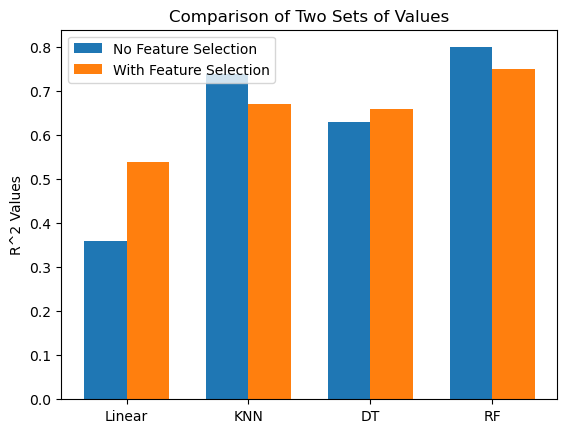

In [107]:
# BEGIN SOLUTION
import matplotlib.pyplot as plt
import numpy as np

# Example data
categories = ['Linear', 'KNN', 'DT', 'RF']
values_set1 = [.36, .74, .63, .8]
values_set2 = [.54, .67, .66, 0.75]

# Set the width of the bars
bar_width = 0.35

# Set the positions of the bars on the x-axis
r1 = np.arange(len(categories))
r2 = [x + bar_width for x in r1]

# Create the bar graph
plt.bar(r1, values_set1, width=bar_width, label='No Feature Selection')
plt.bar(r2, values_set2, width=bar_width, label='With Feature Selection')



plt.ylabel('R^2 Values')
plt.title('Comparison of R^2')
plt.xticks([r + bar_width/2 for r in range(len(categories))], categories)
plt.legend()


plt.show()





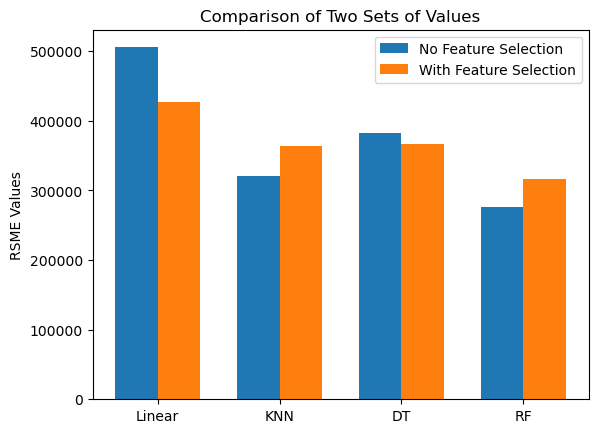

In [110]:
# BEGIN SOLUTION
import matplotlib.pyplot as plt
import numpy as np


categories = ['Linear', 'KNN', 'DT', 'RF']
values_set1 = [505489, 320345,382748, 276458]
values_set2 = [426875, 363719, 366665, 316166]


r1 = np.arange(len(categories))
r2 = [x + bar_width for x in r1]


plt.bar(r1, values_set1, width=bar_width, label='No Feature Selection')
plt.bar(r2, values_set2, width=bar_width, label='With Feature Selection')



plt.ylabel('RSME Values')
plt.title('Comparison of Two Sets of Values')
plt.xticks([r + bar_width/2 for r in range(len(categories))], categories)
plt.legend()


plt.show()

### Problem 5.2:

**Write up** Summarize your results and provide some crucial insights about the entire with and without feature engineering process such as which model performed the best and why, based on what metrics and indicators, etc. Which model benefited the most/the least from the feature engineering (if any)?

The linear model benefited the most while the other models where not affected to much. Overall, the value of feature selection depends highly on the type of model.